In [282]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
%matplotlib inline
import seaborn as sns
import warnings
warnings.filterwarnings('ignore')
plt.rcParams['figure.figsize'] = (20,10)
plt.rcParams['figure.dpi'] = 310
from sklearn.model_selection import train_test_split
from sklearn.linear_model import Lasso, Ridge, ElasticNet
from sklearn.impute import SimpleImputer

In [283]:
df = pd.read_csv(r"F:\Krishna\Excel R\Data Scientist\Assignments\MLR\ToyotaCorolla - MLR.csv")
df

,Price,Age_08_04,KM,Fuel_Type,HP,Automatic,cc,Doors,Cylinders,Gears,Weight
0,13500,23,46986,Diesel,90,0,2000,3,4,5,1165
1,13750,23,72937,Diesel,90,0,2000,3,4,5,1165
2,13950,24,41711,Diesel,90,0,2000,3,4,5,1165
3,14950,26,48000,Diesel,90,0,2000,3,4,5,1165
4,13750,30,38500,Diesel,90,0,2000,3,4,5,1170
...,...,...,...,...,...,...,...,...,...,...,...
1431,7500,69,20544,Petrol,86,0,1300,3,4,5,1025
1432,10845,72,19000,Petrol,86,0,1300,3,4,5,1015
1433,8500,71,17016,Petrol,86,0,1300,3,4,5,1015
1434,7250,70,16916,Petrol,86,0,1300,3,4,5,1015


In [284]:
df.describe()

,Price,Age_08_04,KM,HP,Automatic,cc,Doors,Cylinders,Gears,Weight
count,1436.000000,1436.000000,1436.000000,1436.000000,1436.000000,1436.00000,1436.000000,1436.0,1436.000000,1436.00000
mean,10730.824513,55.947075,68533.259749,101.502089,0.055710,1576.85585,4.033426,4.0,5.026462,1072.45961
std,3626.964585,18.599988,37506.448872,14.981080,0.229441,424.38677,0.952677,0.0,0.188510,52.64112
min,4350.000000,1.000000,1.000000,69.000000,0.000000,1300.00000,2.000000,4.0,3.000000,1000.00000
25%,8450.000000,44.000000,43000.000000,90.000000,0.000000,1400.00000,3.000000,4.0,5.000000,1040.00000
50%,9900.000000,61.000000,63389.500000,110.000000,0.000000,1600.00000,4.000000,4.0,5.000000,1070.00000
75%,11950.000000,70.000000,87020.750000,110.000000,0.000000,1600.00000,5.000000,4.0,5.000000,1085.00000
max,32500.000000,80.000000,243000.000000,192.000000,1.000000,16000.00000,5.000000,4.0,6.000000,1615.00000


There are no null values.

In [285]:
df = pd.get_dummies(data = df, columns = ['Fuel_Type'])

In [286]:
df

,Price,Age_08_04,KM,HP,Automatic,cc,Doors,Cylinders,Gears,Weight,Fuel_Type_CNG,Fuel_Type_Diesel,Fuel_Type_Petrol
0,13500,23,46986,90,0,2000,3,4,5,1165,0,1,0
1,13750,23,72937,90,0,2000,3,4,5,1165,0,1,0
2,13950,24,41711,90,0,2000,3,4,5,1165,0,1,0
3,14950,26,48000,90,0,2000,3,4,5,1165,0,1,0
4,13750,30,38500,90,0,2000,3,4,5,1170,0,1,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...
1431,7500,69,20544,86,0,1300,3,4,5,1025,0,0,1
1432,10845,72,19000,86,0,1300,3,4,5,1015,0,0,1
1433,8500,71,17016,86,0,1300,3,4,5,1015,0,0,1
1434,7250,70,16916,86,0,1300,3,4,5,1015,0,0,1


<Axes: >

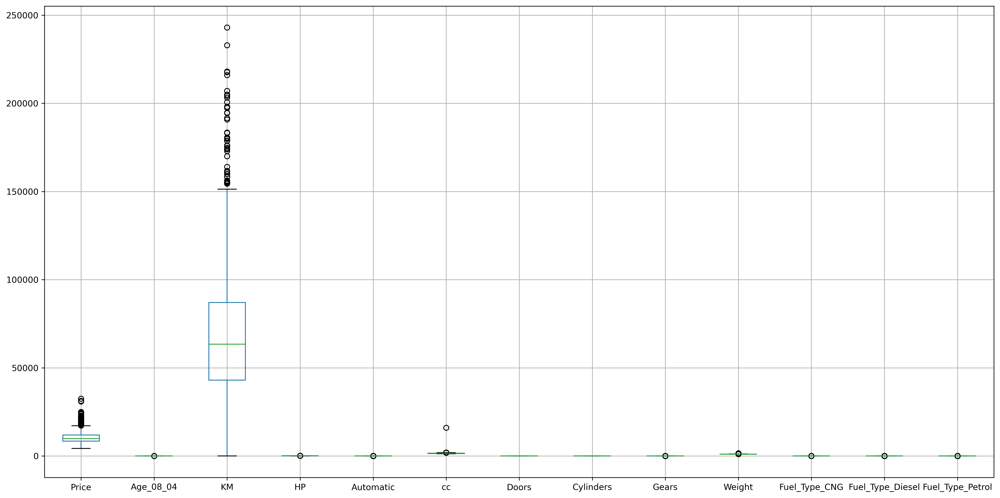

In [287]:
df.boxplot()

<Axes: >

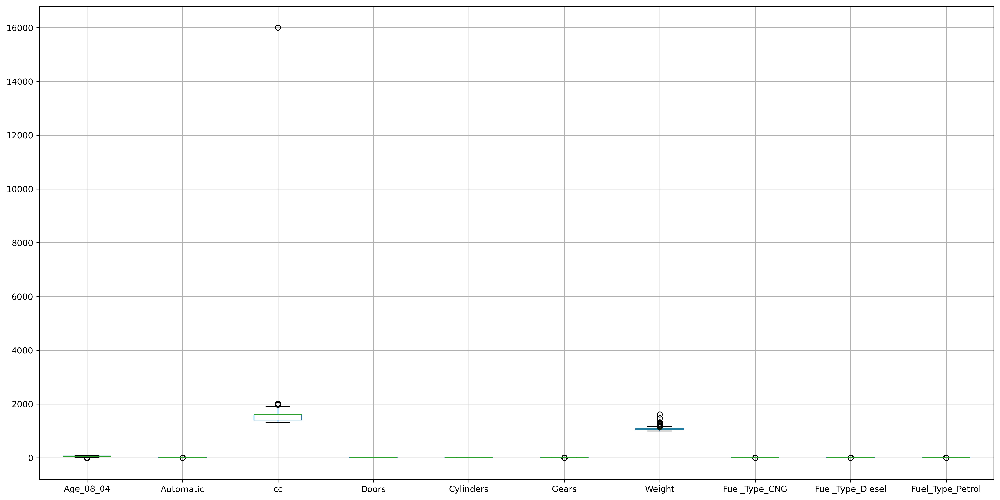

In [288]:
df.iloc[:, [1,4,5,6,7,8,9,10,11,12]].boxplot()

<Axes: >

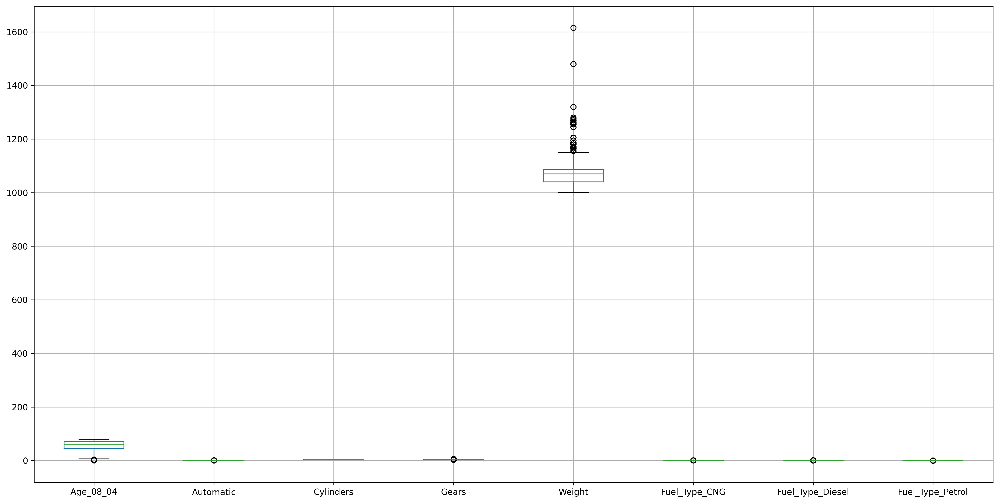

In [289]:
df.iloc[:, [1,4,7,8,9,10,11,12]].boxplot()

We do have some outliers in almost all the columns except Doors and Cylinders.

In [290]:
df['HP'].unique()

array([ 90, 192,  69, 110,  97,  71, 116,  98,  86,  72, 107,  73],
      dtype=int64)

In [291]:
df['Automatic'].unique()

array([0, 1], dtype=int64)

In [292]:
df['Doors'].unique()

array([3, 5, 4, 2], dtype=int64)

In [293]:
df['Cylinders'].unique()

array([4], dtype=int64)

In [294]:
df['Gears'].unique()

array([5, 6, 3, 4], dtype=int64)

In [295]:
df['cc'].unique()

array([ 2000,  1800,  1900,  1600,  1400,  1598, 16000,  1995,  1398,
        1300,  1587,  1975,  1332], dtype=int64)

Cylinders is having same values all along, so we can drop the same column.

In [296]:
df.drop(columns = ['Cylinders'], inplace = True)

In [297]:
df

,Price,Age_08_04,KM,HP,Automatic,cc,Doors,Gears,Weight,Fuel_Type_CNG,Fuel_Type_Diesel,Fuel_Type_Petrol
0,13500,23,46986,90,0,2000,3,5,1165,0,1,0
1,13750,23,72937,90,0,2000,3,5,1165,0,1,0
2,13950,24,41711,90,0,2000,3,5,1165,0,1,0
3,14950,26,48000,90,0,2000,3,5,1165,0,1,0
4,13750,30,38500,90,0,2000,3,5,1170,0,1,0
...,...,...,...,...,...,...,...,...,...,...,...,...
1431,7500,69,20544,86,0,1300,3,5,1025,0,0,1
1432,10845,72,19000,86,0,1300,3,5,1015,0,0,1
1433,8500,71,17016,86,0,1300,3,5,1015,0,0,1
1434,7250,70,16916,86,0,1300,3,5,1015,0,0,1


In [298]:
sns.pairplot(df)

In [299]:
x = df.iloc[:, 1:12]
x

,Age_08_04,KM,HP,Automatic,cc,Doors,Gears,Weight,Fuel_Type_CNG,Fuel_Type_Diesel,Fuel_Type_Petrol
0,23,46986,90,0,2000,3,5,1165,0,1,0
1,23,72937,90,0,2000,3,5,1165,0,1,0
2,24,41711,90,0,2000,3,5,1165,0,1,0
3,26,48000,90,0,2000,3,5,1165,0,1,0
4,30,38500,90,0,2000,3,5,1170,0,1,0
...,...,...,...,...,...,...,...,...,...,...,...
1431,69,20544,86,0,1300,3,5,1025,0,0,1
1432,72,19000,86,0,1300,3,5,1015,0,0,1
1433,71,17016,86,0,1300,3,5,1015,0,0,1
1434,70,16916,86,0,1300,3,5,1015,0,0,1


In [300]:
y = df['Price']
y

0       13500
1       13750
2       13950
3       14950
4       13750
        ...  
1431     7500
1432    10845
1433     8500
1434     7250
1435     6950
Name: Price, Length: 1436, dtype: int64

In [301]:
xtrain, xtest, ytrain, ytest = train_test_split(x,y, test_size = 0.2, random_state = 42)

In [302]:
xtrain

,Age_08_04,KM,HP,Automatic,cc,Doors,Gears,Weight,Fuel_Type_CNG,Fuel_Type_Diesel,Fuel_Type_Petrol
899,62,59295,86,0,1300,5,5,1035,0,0,1
881,68,61568,110,0,1600,4,5,1035,0,0,1
310,40,38653,110,0,1600,5,5,1080,0,0,1
1145,75,101855,110,0,1600,5,5,1070,0,0,1
31,22,35199,97,0,1400,3,5,1100,0,0,1
...,...,...,...,...,...,...,...,...,...,...,...
1095,76,125778,110,0,1600,3,5,1050,0,0,1
1130,73,107108,110,0,1600,3,5,1050,0,0,1
1294,80,71740,110,0,1600,5,5,1070,0,0,1
860,63,64690,86,0,1300,3,5,1020,0,0,1


In [303]:
xtest

,Age_08_04,KM,HP,Automatic,cc,Doors,Gears,Weight,Fuel_Type_CNG,Fuel_Type_Diesel,Fuel_Type_Petrol
594,50,22500,97,0,1400,3,5,1025,0,0,1
754,68,80426,110,0,1600,3,5,1055,0,0,1
630,59,130000,72,0,2000,4,5,1135,0,1,0
1259,71,76000,110,0,1600,5,5,1070,0,0,1
903,65,59000,110,0,1600,5,5,1075,0,0,1
...,...,...,...,...,...,...,...,...,...,...,...
174,8,9788,110,0,1600,5,5,1130,0,0,1
1428,72,26000,86,0,1300,3,5,1015,0,0,1
297,40,41339,110,0,1600,5,5,1080,0,0,1
1435,76,1,110,0,1600,5,5,1114,0,0,1


In [304]:
ytrain

899      9500
881      9795
310     12950
1145     6450
31      15750
        ...  
1095     6900
1130     7950
1294     6950
860      9750
1126     6800
Name: Price, Length: 1148, dtype: int64

In [305]:
ytest

594     10800
754      9950
630      7500
1259     9250
903      9750
        ...  
174     21950
1428     8450
297     12850
1435     6950
1009     8900
Name: Price, Length: 288, dtype: int64

In [306]:
train_df = xtrain
train_df['Price'] = ytrain

In [307]:
train_df

,Age_08_04,KM,HP,Automatic,cc,Doors,Gears,Weight,Fuel_Type_CNG,Fuel_Type_Diesel,Fuel_Type_Petrol,Price
899,62,59295,86,0,1300,5,5,1035,0,0,1,9500
881,68,61568,110,0,1600,4,5,1035,0,0,1,9795
310,40,38653,110,0,1600,5,5,1080,0,0,1,12950
1145,75,101855,110,0,1600,5,5,1070,0,0,1,6450
31,22,35199,97,0,1400,3,5,1100,0,0,1,15750
...,...,...,...,...,...,...,...,...,...,...,...,...
1095,76,125778,110,0,1600,3,5,1050,0,0,1,6900
1130,73,107108,110,0,1600,3,5,1050,0,0,1,7950
1294,80,71740,110,0,1600,5,5,1070,0,0,1,6950
860,63,64690,86,0,1300,3,5,1020,0,0,1,9750


In [308]:
train_df.reset_index(inplace = True)

In [309]:
train_df

,index,Age_08_04,KM,HP,Automatic,cc,Doors,Gears,Weight,Fuel_Type_CNG,Fuel_Type_Diesel,Fuel_Type_Petrol,Price
0,899,62,59295,86,0,1300,5,5,1035,0,0,1,9500
1,881,68,61568,110,0,1600,4,5,1035,0,0,1,9795
2,310,40,38653,110,0,1600,5,5,1080,0,0,1,12950
3,1145,75,101855,110,0,1600,5,5,1070,0,0,1,6450
4,31,22,35199,97,0,1400,3,5,1100,0,0,1,15750
...,...,...,...,...,...,...,...,...,...,...,...,...,...
1143,1095,76,125778,110,0,1600,3,5,1050,0,0,1,6900
1144,1130,73,107108,110,0,1600,3,5,1050,0,0,1,7950
1145,1294,80,71740,110,0,1600,5,5,1070,0,0,1,6950
1146,860,63,64690,86,0,1300,3,5,1020,0,0,1,9750


In [310]:
train_df.drop(columns = ['index'], inplace = True)
train_df

,Age_08_04,KM,HP,Automatic,cc,Doors,Gears,Weight,Fuel_Type_CNG,Fuel_Type_Diesel,Fuel_Type_Petrol,Price
0,62,59295,86,0,1300,5,5,1035,0,0,1,9500
1,68,61568,110,0,1600,4,5,1035,0,0,1,9795
2,40,38653,110,0,1600,5,5,1080,0,0,1,12950
3,75,101855,110,0,1600,5,5,1070,0,0,1,6450
4,22,35199,97,0,1400,3,5,1100,0,0,1,15750
...,...,...,...,...,...,...,...,...,...,...,...,...
1143,76,125778,110,0,1600,3,5,1050,0,0,1,6900
1144,73,107108,110,0,1600,3,5,1050,0,0,1,7950
1145,80,71740,110,0,1600,5,5,1070,0,0,1,6950
1146,63,64690,86,0,1300,3,5,1020,0,0,1,9750


In [311]:
import statsmodels.formula.api as smf

In [312]:
model = smf.ols( 'Price~Age_08_04+KM+HP+Automatic+cc+Doors+Gears+Weight+Fuel_Type_CNG+Fuel_Type_Diesel+Fuel_Type_Petrol', data = train_df).fit()

In [313]:
model.params

Intercept          -10365.974457
Age_08_04            -120.830458
KM                     -0.016231
HP                     14.039479
Automatic             148.830927
cc                     -0.030372
Doors                 -60.310974
Gears                 551.600710
Weight                 25.884958
Fuel_Type_CNG       -3889.411537
Fuel_Type_Diesel    -3957.960293
Fuel_Type_Petrol    -2518.602627
dtype: float64

In [314]:
model.pvalues

Intercept            8.258540e-15
Age_08_04           1.700205e-232
KM                   4.793769e-27
HP                   5.090070e-04
Automatic            4.011232e-01
cc                   7.374645e-01
Doors                1.799552e-01
Gears                7.534228e-03
Weight               1.122305e-59
Fuel_Type_CNG        8.223017e-16
Fuel_Type_Diesel     1.731832e-12
Fuel_Type_Petrol     3.037390e-10
dtype: float64

In [315]:
model.rsquared

0.8702643169608926

let's calculate vif first.

In [316]:
from statsmodels.stats.outliers_influence import variance_inflation_factor

In [317]:
data = train_df.drop(columns = ['Price','Automatic', 'Fuel_Type_CNG', 'Fuel_Type_Diesel', 'Fuel_Type_Petrol'])

In [318]:
data

,Age_08_04,KM,HP,cc,Doors,Gears,Weight
0,62,59295,86,1300,5,5,1035
1,68,61568,110,1600,4,5,1035
2,40,38653,110,1600,5,5,1080
3,75,101855,110,1600,5,5,1070
4,22,35199,97,1400,3,5,1100
...,...,...,...,...,...,...,...
1143,76,125778,110,1600,3,5,1050
1144,73,107108,110,1600,3,5,1050
1145,80,71740,110,1600,5,5,1070
1146,63,64690,86,1300,3,5,1020


In [319]:
vif = pd.DataFrame()

In [320]:
vif['Features'] = data.columns

In [321]:
vif

,Features
0,Age_08_04
1,KM
2,HP
3,cc
4,Doors
5,Gears
6,Weight


In [322]:
len(data.columns)

7

In [323]:
vif['VIF'] = [variance_inflation_factor(data,i) for i in range (0,7)]
vif

,Features,VIF
0,Age_08_04,15.136695
1,KM,6.963505
2,HP,57.465672
3,cc,14.032349
4,Doors,21.396505
5,Gears,396.146965
6,Weight,400.487166


We will choose the one with highest vif and the one column having nearest vif to that.(Gears, Weight)

In [324]:
Gears = smf.ols( 'Price~Age_08_04+KM+HP+Automatic+cc+Doors+Gears+Fuel_Type_CNG+Fuel_Type_Diesel+Fuel_Type_Petrol', data = train_df).fit()
Gears.params

Intercept           7739.938225
Age_08_04           -139.437084
KM                    -0.019027
HP                    51.977626
Automatic            950.742386
cc                     0.019907
Doors                218.150804
Gears                715.457739
Fuel_Type_CNG       1542.767750
Fuel_Type_Diesel    4144.879329
Fuel_Type_Petrol    2052.291146
dtype: float64

In [325]:
Gears.rsquared

0.8361336886526666

In [326]:
Weight = smf.ols( 'Price~Age_08_04+KM+HP+Automatic+cc+Doors+Weight+Fuel_Type_CNG+Fuel_Type_Diesel+Fuel_Type_Petrol', data = train_df).fit()
Weight.params

Intercept          -8528.231194
Age_08_04           -120.823078
KM                    -0.015927
HP                    15.777213
Automatic             93.081993
cc                    -0.030236
Doors                -84.483547
Weight                26.069186
Fuel_Type_CNG      -3328.709255
Fuel_Type_Diesel   -3324.507145
Fuel_Type_Petrol   -1875.014794
dtype: float64

In [327]:
Weight.rsquared

0.8694465824043116

Weight's r-squared value is more thats y we will keep Weight and will remove Gear column.

In [328]:
Weight.pvalues

Intercept            7.955630e-14
Age_08_04           9.704222e-232
KM                   3.668899e-26
HP                   8.004426e-05
Automatic            5.979149e-01
cc                   7.392799e-01
Doors                5.594648e-02
Weight               3.019080e-60
Fuel_Type_CNG        1.827849e-14
Fuel_Type_Diesel     6.003396e-11
Fuel_Type_Petrol     3.945742e-09
dtype: float64

Model Validation Techniques

In [329]:
model = smf.ols( 'Price~Age_08_04+KM+HP+Automatic+cc+Doors+Weight+Fuel_Type_CNG+Fuel_Type_Diesel+Fuel_Type_Petrol', data = train_df).fit()
model.params

Intercept          -8528.231194
Age_08_04           -120.823078
KM                    -0.015927
HP                    15.777213
Automatic             93.081993
cc                    -0.030236
Doors                -84.483547
Weight                26.069186
Fuel_Type_CNG      -3328.709255
Fuel_Type_Diesel   -3324.507145
Fuel_Type_Petrol   -1875.014794
dtype: float64

In [330]:
model.rsquared

0.8694465824043116

In [331]:
import statsmodels.api as sm

In [332]:
model.fittedvalues

0        9038.060731
1        8730.986315
2       13567.627604
3        8071.515117
4       16288.748780
            ...     
1143     7217.255814
1144     7877.080553
1145     7947.038773
1146     8609.241244
1147     6509.737025
Length: 1148, dtype: float64

In [333]:
model.resid

0        461.939269
1       1064.013685
2       -617.627604
3      -1621.515117
4       -538.748780
           ...     
1143    -317.255814
1144      72.919447
1145    -997.038773
1146    1140.758756
1147     290.262975
Length: 1148, dtype: float64

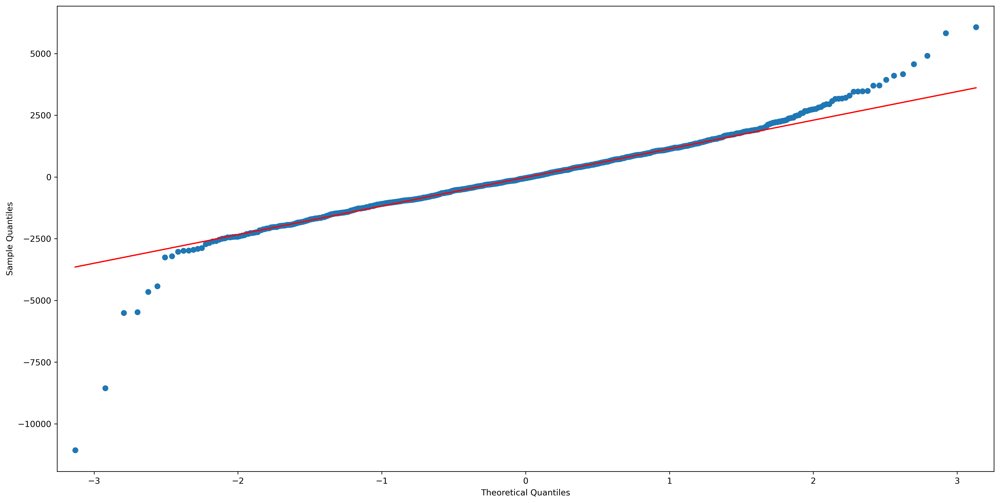

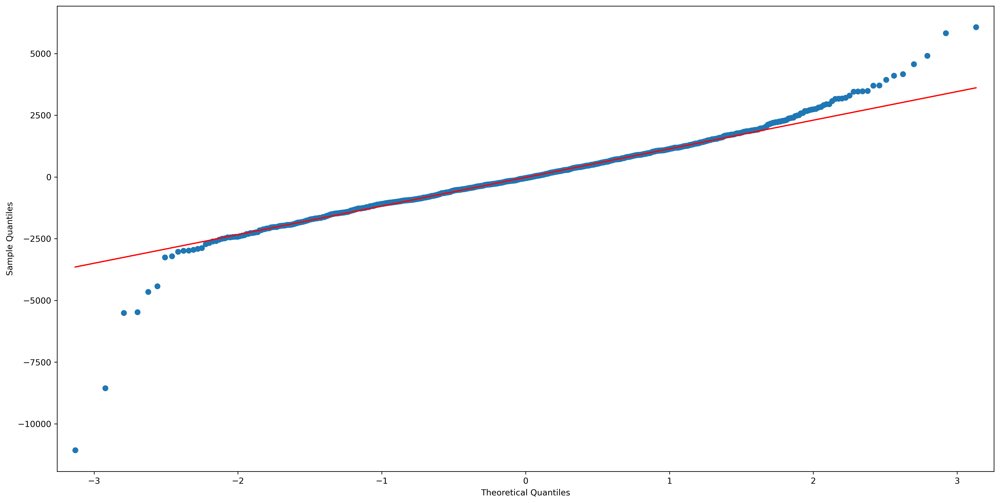

In [334]:
#Q-Q Plot
sm.qqplot(model.resid, line = 'q')

In [335]:
np.argmin(model.resid), np.min(model.resid)

(1025, -11069.727032943345)

We have Outlier as shown in above chart, so its not Normally Distributed.

Text(0.5, 1.0, 'Constant Variance')

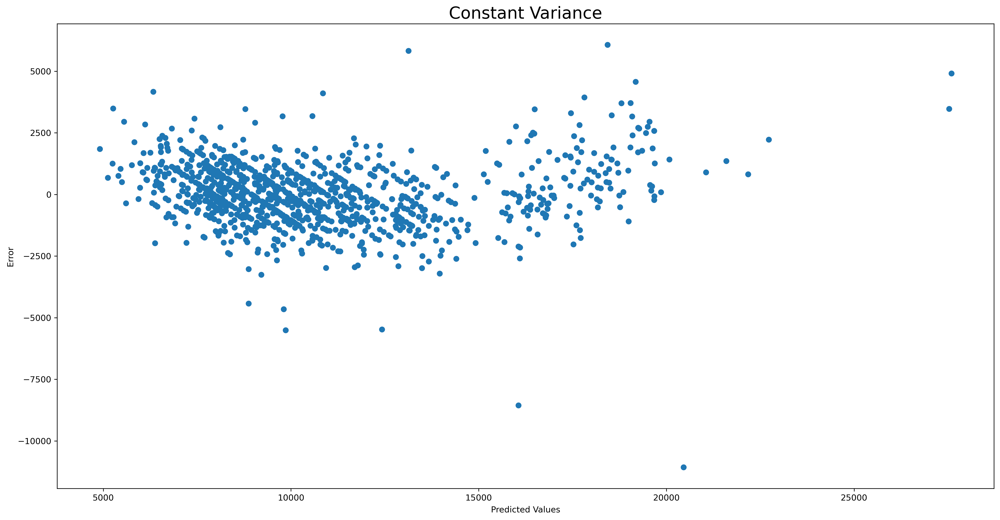

In [336]:
plt.scatter(model.fittedvalues, model.resid)     
plt.xlabel('Predicted Values')
plt.ylabel('Error')
plt.title('Constant Variance', size = 20)

There shouldn't be any pattern, but our graph is having some shape, therefore no Constant Variance.

In [337]:
train_df

,Age_08_04,KM,HP,Automatic,cc,Doors,Gears,Weight,Fuel_Type_CNG,Fuel_Type_Diesel,Fuel_Type_Petrol,Price
0,62,59295,86,0,1300,5,5,1035,0,0,1,9500
1,68,61568,110,0,1600,4,5,1035,0,0,1,9795
2,40,38653,110,0,1600,5,5,1080,0,0,1,12950
3,75,101855,110,0,1600,5,5,1070,0,0,1,6450
4,22,35199,97,0,1400,3,5,1100,0,0,1,15750
...,...,...,...,...,...,...,...,...,...,...,...,...
1143,76,125778,110,0,1600,3,5,1050,0,0,1,6900
1144,73,107108,110,0,1600,3,5,1050,0,0,1,7950
1145,80,71740,110,0,1600,5,5,1070,0,0,1,6950
1146,63,64690,86,0,1300,3,5,1020,0,0,1,9750


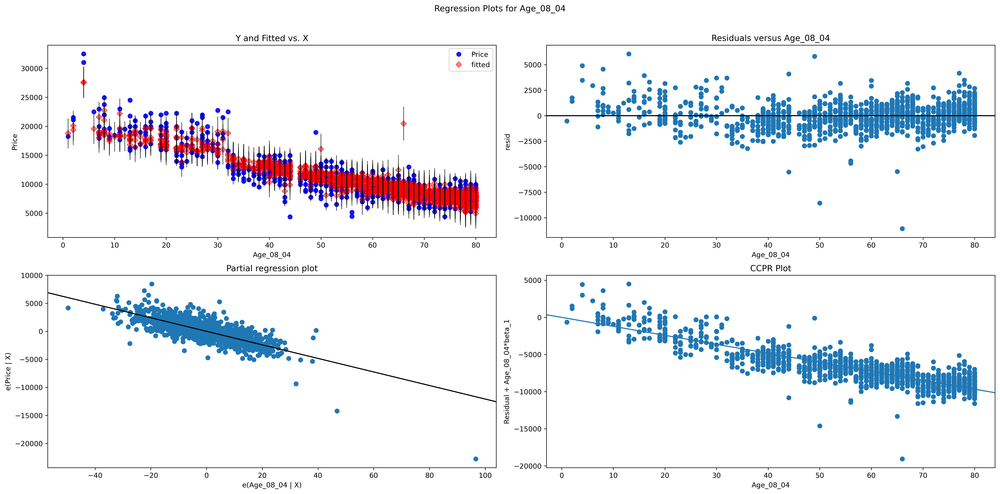

In [338]:
sm.graphics.plot_regress_exog(model, 'Age_08_04');

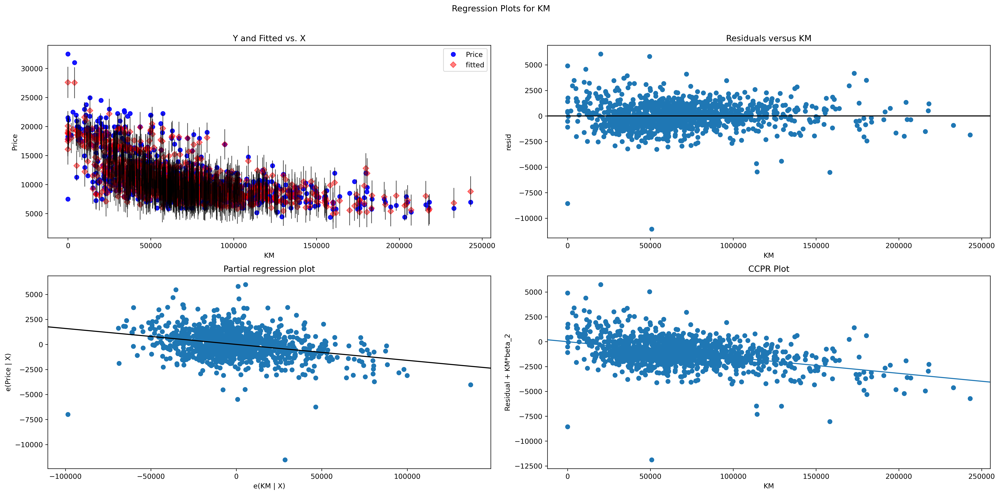

In [339]:
sm.graphics.plot_regress_exog(model, 'KM');

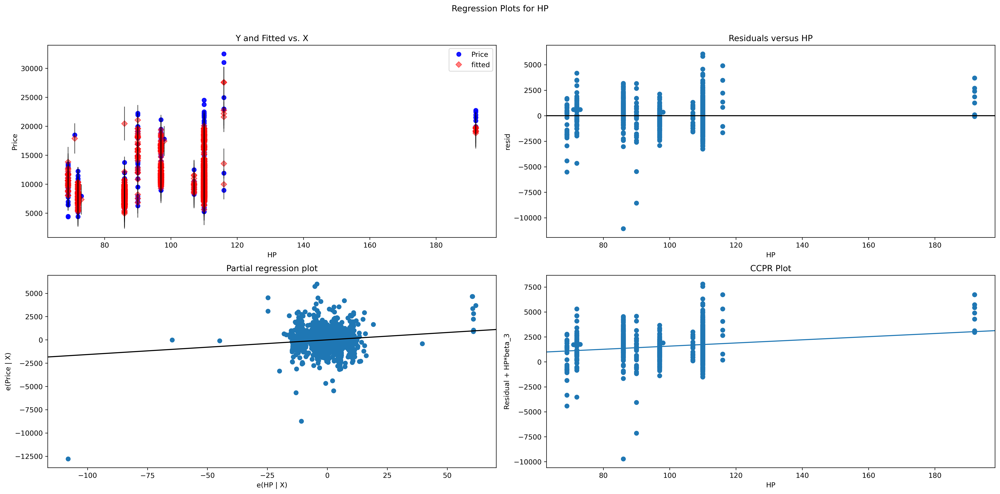

In [340]:
sm.graphics.plot_regress_exog(model, 'HP');

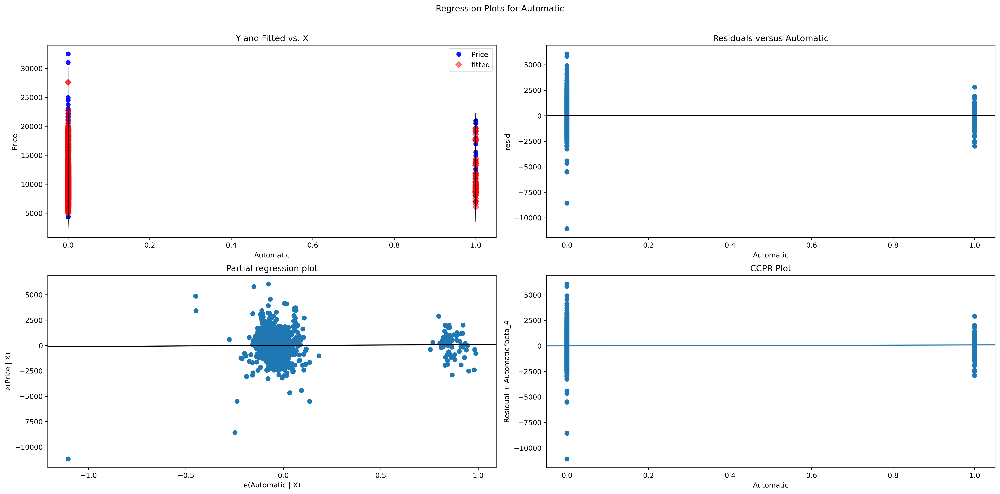

In [341]:
sm.graphics.plot_regress_exog(model, 'Automatic');

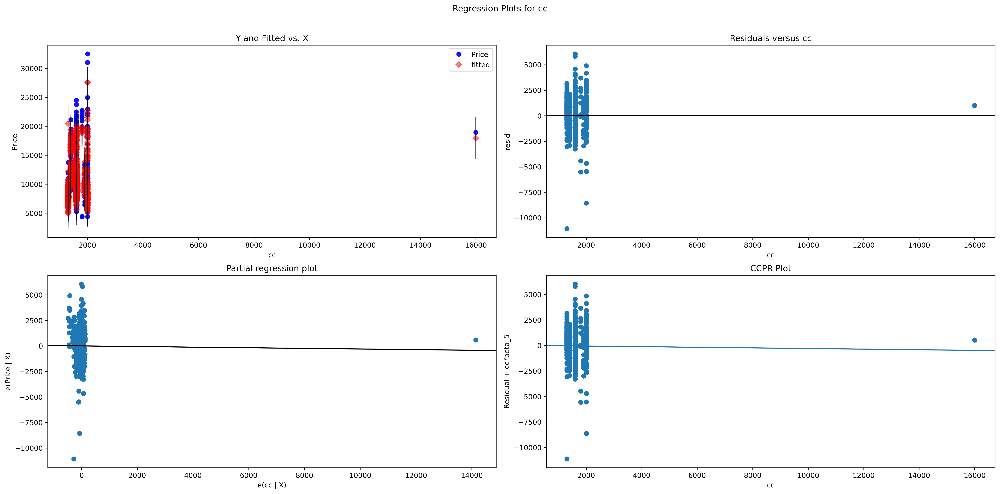

In [342]:
sm.graphics.plot_regress_exog(model, 'cc');

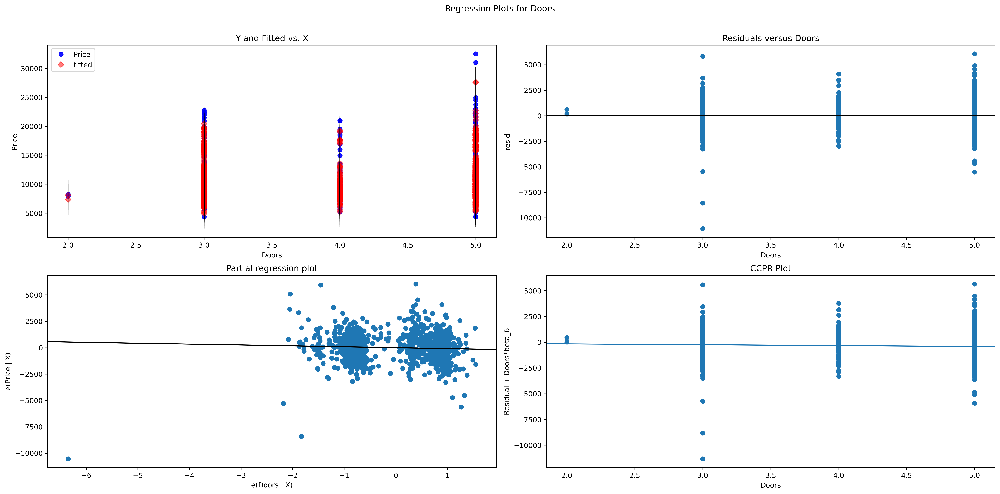

In [343]:
sm.graphics.plot_regress_exog(model, 'Doors');

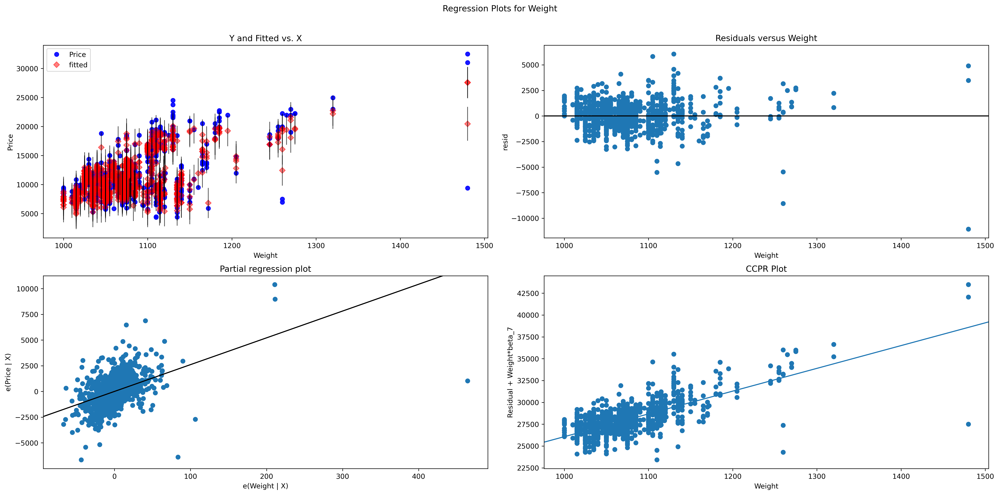

In [344]:
sm.graphics.plot_regress_exog(model, 'Weight');

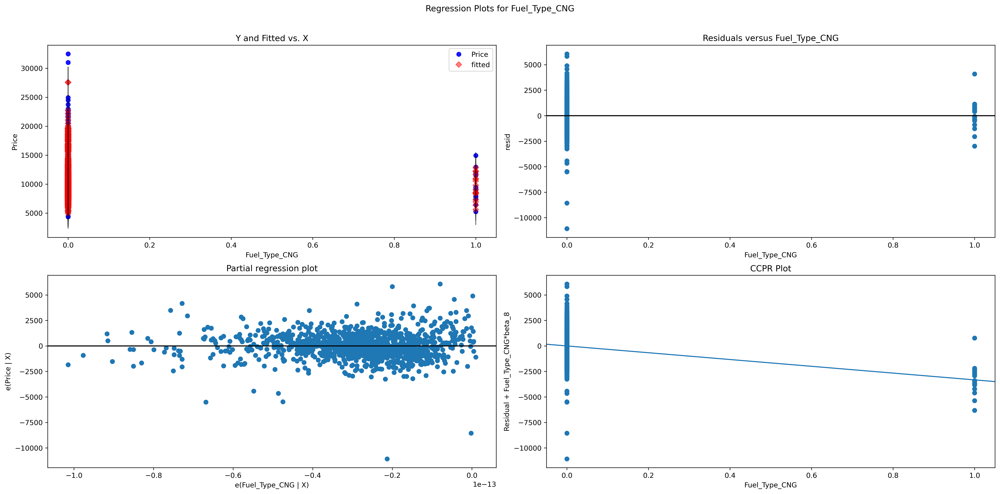

In [345]:
sm.graphics.plot_regress_exog(model, 'Fuel_Type_CNG');

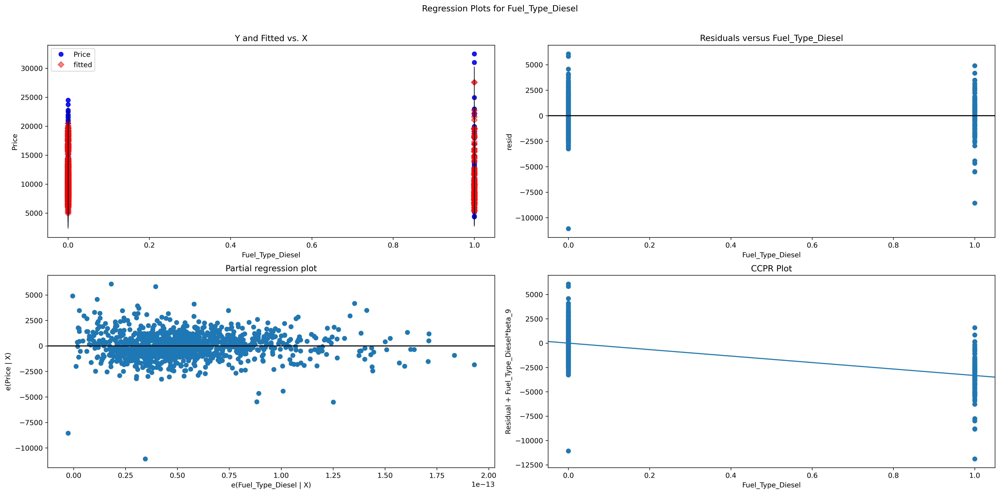

In [346]:
sm.graphics.plot_regress_exog(model, 'Fuel_Type_Diesel');

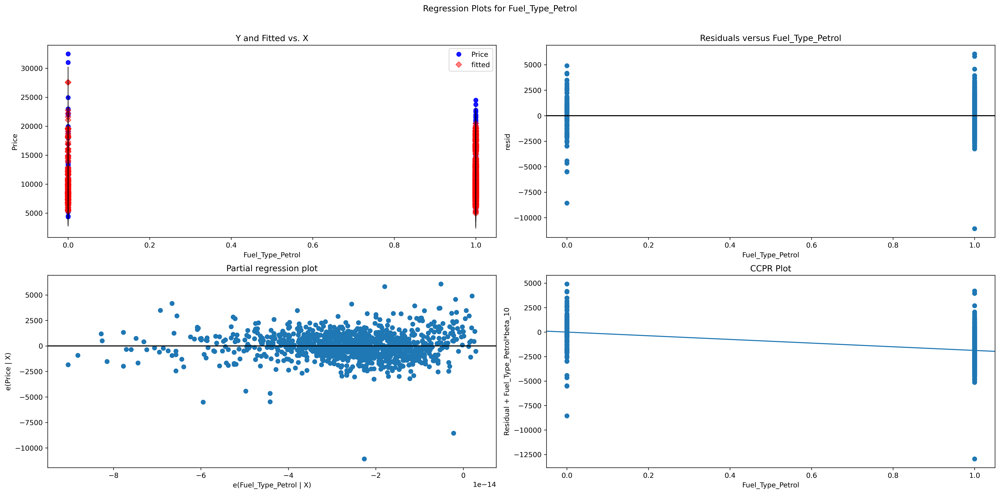

In [347]:
sm.graphics.plot_regress_exog(model, 'Fuel_Type_Petrol');

From all these plots, we have concluded that Our model is not good, Bcz its not satisfying all the Assumptions. therefore now we will find what's the problem with our model.

Model Deletion Techniques

Will create stem plot to find influence point

In [348]:
model

In [349]:
model.rsquared

0.8694465824043116

In [350]:
inf = model.get_influence()

In [351]:
c, p = inf.cooks_distance
c

array([4.90289934e-05, 1.68981619e-04, 5.58279434e-05, ...,
       2.47961909e-04, 2.60067820e-04, 1.68918552e-05])

Text(0, 0.5, 'Cooks Distance')

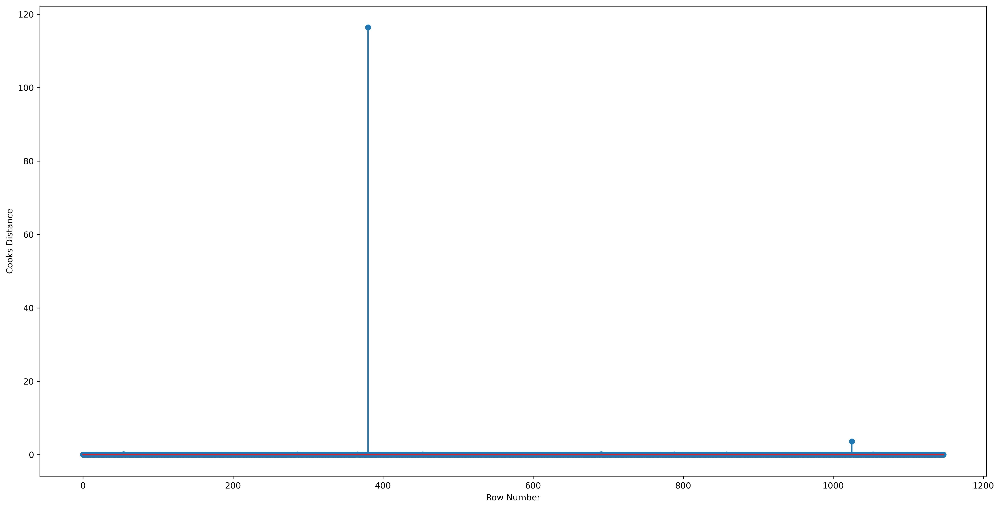

In [352]:
plt.stem(c)
plt.xlabel('Row Number')
plt.ylabel('Cooks Distance')

In [353]:
np.argmax(c), np.max(c)

(380, 116.41104393377472)

to improve the model, we will delete this row with influence point

In [354]:
train_df

,Age_08_04,KM,HP,Automatic,cc,Doors,Gears,Weight,Fuel_Type_CNG,Fuel_Type_Diesel,Fuel_Type_Petrol,Price
0,62,59295,86,0,1300,5,5,1035,0,0,1,9500
1,68,61568,110,0,1600,4,5,1035,0,0,1,9795
2,40,38653,110,0,1600,5,5,1080,0,0,1,12950
3,75,101855,110,0,1600,5,5,1070,0,0,1,6450
4,22,35199,97,0,1400,3,5,1100,0,0,1,15750
...,...,...,...,...,...,...,...,...,...,...,...,...
1143,76,125778,110,0,1600,3,5,1050,0,0,1,6900
1144,73,107108,110,0,1600,3,5,1050,0,0,1,7950
1145,80,71740,110,0,1600,5,5,1070,0,0,1,6950
1146,63,64690,86,0,1300,3,5,1020,0,0,1,9750


In [355]:
train_df.drop(index=380, inplace = True)

In [356]:
train_df

,Age_08_04,KM,HP,Automatic,cc,Doors,Gears,Weight,Fuel_Type_CNG,Fuel_Type_Diesel,Fuel_Type_Petrol,Price
0,62,59295,86,0,1300,5,5,1035,0,0,1,9500
1,68,61568,110,0,1600,4,5,1035,0,0,1,9795
2,40,38653,110,0,1600,5,5,1080,0,0,1,12950
3,75,101855,110,0,1600,5,5,1070,0,0,1,6450
4,22,35199,97,0,1400,3,5,1100,0,0,1,15750
...,...,...,...,...,...,...,...,...,...,...,...,...
1143,76,125778,110,0,1600,3,5,1050,0,0,1,6900
1144,73,107108,110,0,1600,3,5,1050,0,0,1,7950
1145,80,71740,110,0,1600,5,5,1070,0,0,1,6950
1146,63,64690,86,0,1300,3,5,1020,0,0,1,9750


In [357]:
train_df.reset_index(inplace = True)
train_df

,index,Age_08_04,KM,HP,Automatic,cc,Doors,Gears,Weight,Fuel_Type_CNG,Fuel_Type_Diesel,Fuel_Type_Petrol,Price
0,0,62,59295,86,0,1300,5,5,1035,0,0,1,9500
1,1,68,61568,110,0,1600,4,5,1035,0,0,1,9795
2,2,40,38653,110,0,1600,5,5,1080,0,0,1,12950
3,3,75,101855,110,0,1600,5,5,1070,0,0,1,6450
4,4,22,35199,97,0,1400,3,5,1100,0,0,1,15750
...,...,...,...,...,...,...,...,...,...,...,...,...,...
1142,1143,76,125778,110,0,1600,3,5,1050,0,0,1,6900
1143,1144,73,107108,110,0,1600,3,5,1050,0,0,1,7950
1144,1145,80,71740,110,0,1600,5,5,1070,0,0,1,6950
1145,1146,63,64690,86,0,1300,3,5,1020,0,0,1,9750


In [358]:
train_df.drop(columns = ['index'], inplace = True)
train_df

,Age_08_04,KM,HP,Automatic,cc,Doors,Gears,Weight,Fuel_Type_CNG,Fuel_Type_Diesel,Fuel_Type_Petrol,Price
0,62,59295,86,0,1300,5,5,1035,0,0,1,9500
1,68,61568,110,0,1600,4,5,1035,0,0,1,9795
2,40,38653,110,0,1600,5,5,1080,0,0,1,12950
3,75,101855,110,0,1600,5,5,1070,0,0,1,6450
4,22,35199,97,0,1400,3,5,1100,0,0,1,15750
...,...,...,...,...,...,...,...,...,...,...,...,...
1142,76,125778,110,0,1600,3,5,1050,0,0,1,6900
1143,73,107108,110,0,1600,3,5,1050,0,0,1,7950
1144,80,71740,110,0,1600,5,5,1070,0,0,1,6950
1145,63,64690,86,0,1300,3,5,1020,0,0,1,9750


Creating the final model

In [359]:
final_model = smf.ols( 'Price~Age_08_04+KM+HP+Automatic+cc+Doors+Weight+Fuel_Type_CNG+Fuel_Type_Diesel+Fuel_Type_Petrol', data = train_df).fit()
final_model.params

Intercept          -5919.125931
Age_08_04           -119.717794
KM                    -0.015166
HP                    44.080663
Automatic            151.305769
cc                    -3.244927
Doors                -45.385041
Weight                25.090970
Fuel_Type_CNG      -3150.597719
Fuel_Type_Diesel    -974.349086
Fuel_Type_Petrol   -1794.179126
dtype: float64

In [360]:
final_model.rsquared

0.8720616231164056

In [361]:
ypred = final_model.predict(xtest)

In [362]:
ypred

594     11274.595408
754      8917.986249
630      9052.314691
1259     8911.550177
903     10013.126585
            ...     
174     18963.372545
1428     8176.420142
297     13399.365530
1435    10569.532503
1009    10529.269463
Length: 288, dtype: float64

In [363]:
ytest

594     10800
754      9950
630      7500
1259     9250
903      9750
        ...  
174     21950
1428     8450
297     12850
1435     6950
1009     8900
Name: Price, Length: 288, dtype: int64

let's use Lasso and Ridge Regression to deal with multi-collinearity

Lasso Regression

In [368]:
df

,Price,Age_08_04,KM,HP,Automatic,cc,Doors,Gears,Weight,Fuel_Type_CNG,Fuel_Type_Diesel,Fuel_Type_Petrol
0,13500,23,46986,90,0,2000,3,5,1165,0,1,0
1,13750,23,72937,90,0,2000,3,5,1165,0,1,0
2,13950,24,41711,90,0,2000,3,5,1165,0,1,0
3,14950,26,48000,90,0,2000,3,5,1165,0,1,0
4,13750,30,38500,90,0,2000,3,5,1170,0,1,0
...,...,...,...,...,...,...,...,...,...,...,...,...
1431,7500,69,20544,86,0,1300,3,5,1025,0,0,1
1432,10845,72,19000,86,0,1300,3,5,1015,0,0,1
1433,8500,71,17016,86,0,1300,3,5,1015,0,0,1
1434,7250,70,16916,86,0,1300,3,5,1015,0,0,1


In [369]:
x = df.iloc[:, 1:12]
x

,Age_08_04,KM,HP,Automatic,cc,Doors,Gears,Weight,Fuel_Type_CNG,Fuel_Type_Diesel,Fuel_Type_Petrol
0,23,46986,90,0,2000,3,5,1165,0,1,0
1,23,72937,90,0,2000,3,5,1165,0,1,0
2,24,41711,90,0,2000,3,5,1165,0,1,0
3,26,48000,90,0,2000,3,5,1165,0,1,0
4,30,38500,90,0,2000,3,5,1170,0,1,0
...,...,...,...,...,...,...,...,...,...,...,...
1431,69,20544,86,0,1300,3,5,1025,0,0,1
1432,72,19000,86,0,1300,3,5,1015,0,0,1
1433,71,17016,86,0,1300,3,5,1015,0,0,1
1434,70,16916,86,0,1300,3,5,1015,0,0,1


In [370]:
y = df.iloc[:,0]
y

0       13500
1       13750
2       13950
3       14950
4       13750
        ...  
1431     7500
1432    10845
1433     8500
1434     7250
1435     6950
Name: Price, Length: 1436, dtype: int64

In [371]:
xtrain, xtest, ytrain, ytest = train_test_split(x,y, test_size = 0.2, random_state = 42)

In [372]:
xtrain

,Age_08_04,KM,HP,Automatic,cc,Doors,Gears,Weight,Fuel_Type_CNG,Fuel_Type_Diesel,Fuel_Type_Petrol
899,62,59295,86,0,1300,5,5,1035,0,0,1
881,68,61568,110,0,1600,4,5,1035,0,0,1
310,40,38653,110,0,1600,5,5,1080,0,0,1
1145,75,101855,110,0,1600,5,5,1070,0,0,1
31,22,35199,97,0,1400,3,5,1100,0,0,1
...,...,...,...,...,...,...,...,...,...,...,...
1095,76,125778,110,0,1600,3,5,1050,0,0,1
1130,73,107108,110,0,1600,3,5,1050,0,0,1
1294,80,71740,110,0,1600,5,5,1070,0,0,1
860,63,64690,86,0,1300,3,5,1020,0,0,1


In [373]:
ytrain

899      9500
881      9795
310     12950
1145     6450
31      15750
        ...  
1095     6900
1130     7950
1294     6950
860      9750
1126     6800
Name: Price, Length: 1148, dtype: int64

In [374]:
xtest

,Age_08_04,KM,HP,Automatic,cc,Doors,Gears,Weight,Fuel_Type_CNG,Fuel_Type_Diesel,Fuel_Type_Petrol
594,50,22500,97,0,1400,3,5,1025,0,0,1
754,68,80426,110,0,1600,3,5,1055,0,0,1
630,59,130000,72,0,2000,4,5,1135,0,1,0
1259,71,76000,110,0,1600,5,5,1070,0,0,1
903,65,59000,110,0,1600,5,5,1075,0,0,1
...,...,...,...,...,...,...,...,...,...,...,...
174,8,9788,110,0,1600,5,5,1130,0,0,1
1428,72,26000,86,0,1300,3,5,1015,0,0,1
297,40,41339,110,0,1600,5,5,1080,0,0,1
1435,76,1,110,0,1600,5,5,1114,0,0,1


In [375]:
ytest

594     10800
754      9950
630      7500
1259     9250
903      9750
        ...  
174     21950
1428     8450
297     12850
1435     6950
1009     8900
Name: Price, Length: 288, dtype: int64

In [376]:
l1 = Lasso()
l1.fit(xtrain, ytrain)
l1.score(xtrain, ytrain), l1.score(xtest, ytest)

(0.8702575334538365, 0.8354626401159695)

In [377]:
l1.coef_

array([-1.20798032e+02, -1.63255341e-02,  1.45592197e+01,  1.33401451e+02,
       -3.23988233e-02, -5.86731618e+01,  5.22177478e+02,  2.57219632e+01,
        0.00000000e+00, -3.23101622e+01,  1.36439169e+03])

We are getting overfitted results. So,Let's find proper Alpha Value via Hyper parameter tuning

In [378]:
for i in range(1,100):
    l1 = Lasso(alpha = i)
    l1.fit(xtrain, ytrain)
    print(f'Alpha : {i} Train : {l1.score(xtrain, ytrain)} Test: {l1.score(xtest, ytest)}')

Alpha : 1 Train : 0.8702575334538365 Test: 0.8354626401159695
Alpha : 2 Train : 0.8702375950811821 Test: 0.8360023594048915
Alpha : 3 Train : 0.8702085624320768 Test: 0.8363588951991752
Alpha : 4 Train : 0.8701679167152059 Test: 0.836706442341485
Alpha : 5 Train : 0.8701156579293212 Test: 0.8370450005869966
Alpha : 6 Train : 0.8700517860958903 Test: 0.8373745690421791
Alpha : 7 Train : 0.8699763011864691 Test: 0.8376951488586379
Alpha : 8 Train : 0.8698892032499291 Test: 0.8380067385505745
Alpha : 9 Train : 0.8697984441051115 Test: 0.838353666017045
Alpha : 10 Train : 0.8697104442294209 Test: 0.8387636855207653
Alpha : 11 Train : 0.869613181325863 Test: 0.8391662054666702
Alpha : 12 Train : 0.8695066553072073 Test: 0.8395612272097384
Alpha : 13 Train : 0.8693908659844933 Test: 0.8399487526490035
Alpha : 14 Train : 0.869265763136118 Test: 0.8403292240503812
Alpha : 15 Train : 0.8691314527477145 Test: 0.8407016851459984
Alpha : 16 Train : 0.8689878664436326 Test: 0.8410667466143079
Alpha

we will choose the alpha value giving almost same accuracy for training and testing

In [380]:
l1 = Lasso(alpha = 43)                
l1.fit(xtrain, ytrain)
print(f' Train : {l1.score(xtrain, ytrain)} Test: {l1.score(xtest, ytest)}')

 Train : 0.864506415071896 Test: 0.8502354669614923


In [381]:
l1.coef_

array([-1.19770812e+02, -2.01574171e-02,  2.88523941e+01,  0.00000000e+00,
       -9.90028086e-02, -0.00000000e+00,  0.00000000e+00,  2.01485340e+01,
       -0.00000000e+00, -0.00000000e+00,  1.15129609e+01])

In [382]:
x.columns

Index(['Age_08_04', 'KM', 'HP', 'Automatic', 'cc', 'Doors', 'Gears', 'Weight',
       'Fuel_Type_CNG', 'Fuel_Type_Diesel', 'Fuel_Type_Petrol'],
      dtype='object')

Lasso regression is used for both Over fitting as well as Feature selection. As above results, it have converted many column's slopes to 0, therefore it is indicating that we can remove those columns from our model as those columns are anyway not much affecting the result of our model.

Ridge Regression

In [383]:
l2 = Ridge()             
l2.fit(xtrain, ytrain)
print(f'Train : {l2.score(xtrain, ytrain)} Test: {l2.score(xtest, ytest)}')

Train : 0.8702622332138238 Test: 0.8352480030162183


In [384]:
for i in range(1,100):
    l2 = Ridge(alpha = i)
    l2.fit(xtrain, ytrain)
    print(f'Alpha : {i} Train : {l2.score(xtrain, ytrain)} Test: {l2.score(xtest, ytest)}')

Alpha : 1 Train : 0.8702622332138238 Test: 0.8352480030162183
Alpha : 2 Train : 0.8702563132183714 Test: 0.8355931703247668
Alpha : 3 Train : 0.8702470070507391 Test: 0.8359249279840804
Alpha : 4 Train : 0.8702347099056074 Test: 0.8362438917872088
Alpha : 5 Train : 0.870219770027803 Test: 0.8365506633314728
Alpha : 6 Train : 0.8702024952409502 Test: 0.8368458248405389
Alpha : 7 Train : 0.8701831583766722 Test: 0.8371299359669848
Alpha : 8 Train : 0.8701620018295146 Test: 0.8374035319892474
Alpha : 9 Train : 0.8701392414076713 Test: 0.837667122987479
Alpha : 10 Train : 0.8701150696101132 Test: 0.8379211937020288
Alpha : 11 Train : 0.870089658431875 Test: 0.8381662038622864
Alpha : 12 Train : 0.8700631617778443 Test: 0.8384025888333606
Alpha : 13 Train : 0.8700357175492248 Test: 0.8386307604708375
Alpha : 14 Train : 0.8700074494544802 Test: 0.8388511081046698
Alpha : 15 Train : 0.8699784685869665 Test: 0.8390639995955778
Alpha : 16 Train : 0.8699488748039335 Test: 0.839269782423562
Alpha

In [385]:
l2 = Ridge(alpha = 20)          #here for alpha = 20, we are getting generalize model
l2.fit(xtrain, ytrain)
print(f'Train : {l2.score(xtrain, ytrain)} Test: {l2.score(xtest, ytest)}')

Train : 0.8698260381754566 Test: 0.8400281239753892


We have got the Generalize model with all the three methods

Interview Questions

1.  What is Normalization & Standardization and how is it helpful?

-  Standardization and Normalization both are the methods used for Feature Scaling. Via these methods we make data unitless and bring them to small scale, so that for machine every column can be equally important.
-  Standardization : In standardization, we standardized the format (mean and std) of all the columns in the dataset. As after applying standardization the mean of every column will be 0 and std of every columns will be 1.
-  Normalization : In Normalization, we simply bring the data to small scale, between the range of 0 to 1.
-  Both of these methods doesn't change the importance of any column with respect to each other, it just brings them down to small scale.

2.   What techniques can be used to address multicollinearity in multiple linear regression?

-  If any of our independent columns are related to each other, then we can say that there is problem of "Multicollinearity" in our dataset.
-  "Multi-collinearity" is a Problem because it undermines the statistical significance of an independent variable.
-  To remove it, we can remove one of the two columns which are related to each other and there are specific methods to choose which one column should be removed.
-  Techniques, which can be used to address multicollinearity :
   1. Scatter plot : We can plot Scatterplot between all the possible pair of Independent Columns.
   2. Correlation Matrix : If Correlation coefficient between two columns are >+-0.8, then it will be Problematic
   3. VIF (Variance Inflation Factor)